# TU Wien Monthly Mean for SIG0 - MMENSIG0

## Previewing products and information

First the enviroment is loaded and initialized.

In [45]:
import datacube
%matplotlib inline
dc = datacube.Datacube(app='MMENSIG0')

To list the products `list_products()` is called. It is possible to list only certain columns 

In [46]:
prodlist = dc.list_products()
prodlist.columns

Index(['name', 'description', 'creation_time', 'instrument', 'label', 'lat',
       'lon', 'platform', 'format', 'time', 'product_type', 'crs',
       'resolution', 'tile_size', 'spatial_dimensions'],
      dtype='object')

In [47]:
display_columns = ['name', 'description', 'instrument']
prodlist[prodlist['product_type'] == 'TUW_MMENSIG0_S1'][display_columns].dropna()

,name,description,instrument
id,,,
15,MMENSIG0_Sentinel_1,Monthly mean of SIG0.,SAR


To list the specific measurements (bands/polarisations) from the product we can use `pandas.DataFrame.loc` method. The method `get_level_values` fetches the index values from the measurements DataFrame. In the case of the measurements the 0 index refers to the product column and the 1 index refers to the measurement colum. We can see some metadata including the data type, nodata value and units of the measured value.

In [48]:
measlist = dc.list_measurements()
measlist.loc[measlist.index.get_level_values(0) == 'MMENSIG0_Sentinel_1']

aliases  dtype  \
product             measurement                                                 
MMENSIG0_Sentinel_1 VV           [band_1, band_01, B01, Band1, Band_1]  int16   
                    VH           [band_2, band_02, B02, Band2, Band_2]  int16   

                                name  nodata units  
product             measurement                     
MMENSIG0_Sentinel_1 VV            VV   -9999    dB  
                    VH            VH   -9999    dB

In [49]:
query = {
    'lat': (48.15, 48.35),
    'lon': (16.3, 16.5),
    'time': ('2017-04-01', '2017-10-31')
}

To display available datasets along with metadata we can use the `find_datasets_lazy` method and pass in the spatio-temporal bounds. We can see there are 6 datasets below.

In [50]:
for dataset in dc.find_datasets_lazy(product='MMENSIG0_Sentinel_1', **query):
    print(dataset)
    print(dataset.center_time, dataset.metadata_doc['extent']['coord']['ll'])
    print('*'*100)

Dataset <id=80544959-4f46-439d-a895-9c84a80733dc type=MMENSIG0_Sentinel_1 location=file:///home/ubuntu/Datacube/dcArchitect/export/TUW_MMENSIG0_S1/80544959-4f46-439d-a895-9c84a80733dc.yml>
2017-06-15 00:00:00 {'lat': 47.97836637131795, 'lon': 15.45573233623606}
****************************************************************************************************
Dataset <id=b5aa4997-a674-4f68-97ff-203efb1b0857 type=MMENSIG0_Sentinel_1 location=file:///home/ubuntu/Datacube/dcArchitect/export/TUW_MMENSIG0_S1/b5aa4997-a674-4f68-97ff-203efb1b0857.yml>
2017-05-15 12:00:00 {'lat': 47.97836637131795, 'lon': 15.45573233623606}
****************************************************************************************************
Dataset <id=d69c6101-29fd-403c-b1f0-40a2cda519fb type=MMENSIG0_Sentinel_1 location=file:///home/ubuntu/Datacube/dcArchitect/export/TUW_MMENSIG0_S1/d69c6101-29fd-403c-b1f0-40a2cda519fb.yml>
2017-04-14 00:00:00 {'lat': 47.97836637131795, 'lon': 15.45573233623606}
************

## Loading and visualizing data

By specifying the `load` function we can load the data into a desired coordinate reference frame and desired resolution. By passing in the `measurements` we load both polarisations. It is possible to load multiple bands in this manner and use them.

In [51]:
data = dc.load(product='MMENSIG0_Sentinel_1', 
               measurements=['VV', 'VH'], 
               output_crs='EPSG:32633', 
               resolution=(-10,10),
                **query)
data

<xarray.Dataset>
Dimensions:  (time: 6, x: 1526, y: 2250)
Coordinates:
  * time     (time) datetime64[ns] 2017-04-14 2017-05-15T12:00:00 ... 2017-09-16
  * y        (y) float64 5.356e+06 5.356e+06 5.356e+06 ... 5.334e+06 5.334e+06
  * x        (x) float64 5.963e+05 5.963e+05 5.963e+05 ... 6.116e+05 6.116e+05
Data variables:
    VV       (time, y, x) int16 -921 -962 -976 -954 -969 ... -583 -398 -288 -280
    VH       (time, y, x) int16 -1536 -1547 -1469 -1477 ... -994 -858 -819 -802
Attributes:
    crs:      EPSG:32633

Lines below show how data can be subset from the `Dataset` into a `DataArray` and how this data may be plotted using the `matplotlib` `imshow` method. Tutorials on `matplotlib` can be found at https://matplotlib.org/tutorials/index.html

In [52]:
data_plot_vv = data.VV
data_plot_vv

<xarray.DataArray 'VV' (time: 6, y: 2250, x: 1526)>
array([[[ -921,  -962, ..., -1106, -1066],
        [ -889,  -893, ..., -1184, -1114],
        ...,
        [   31,   -52, ...,  -580,  -700],
        [  -97,  -209, ...,  -411,  -446]],

       [[ -836,  -868, ..., -1076, -1042],
        [ -887,  -833, ..., -1207, -1163],
        ...,
        [ -327,  -298, ...,  -497,  -614],
        [ -431,  -378, ...,  -361,  -385]],

       ...,

       [[ -892,  -908, ..., -1018, -1047],
        [ -915,  -834, ..., -1156, -1136],
        ...,
        [ -939,  -948, ...,  -498,  -594],
        [-1092,  -934, ...,  -358,  -397]],

       [[ -798,  -792, ..., -1199, -1208],
        [ -875,  -791, ..., -1308, -1332],
        ...,
        [ -750,  -747, ...,  -407,  -486],
        [ -803,  -796, ...,  -288,  -280]]], dtype=int16)
Coordinates:
  * time     (time) datetime64[ns] 2017-04-14 2017-05-15T12:00:00 ... 2017-09-16
  * y        (y) float64 5.356e+06 5.356e+06 5.356e+06 ... 5.334e+06 5.334e+06
 

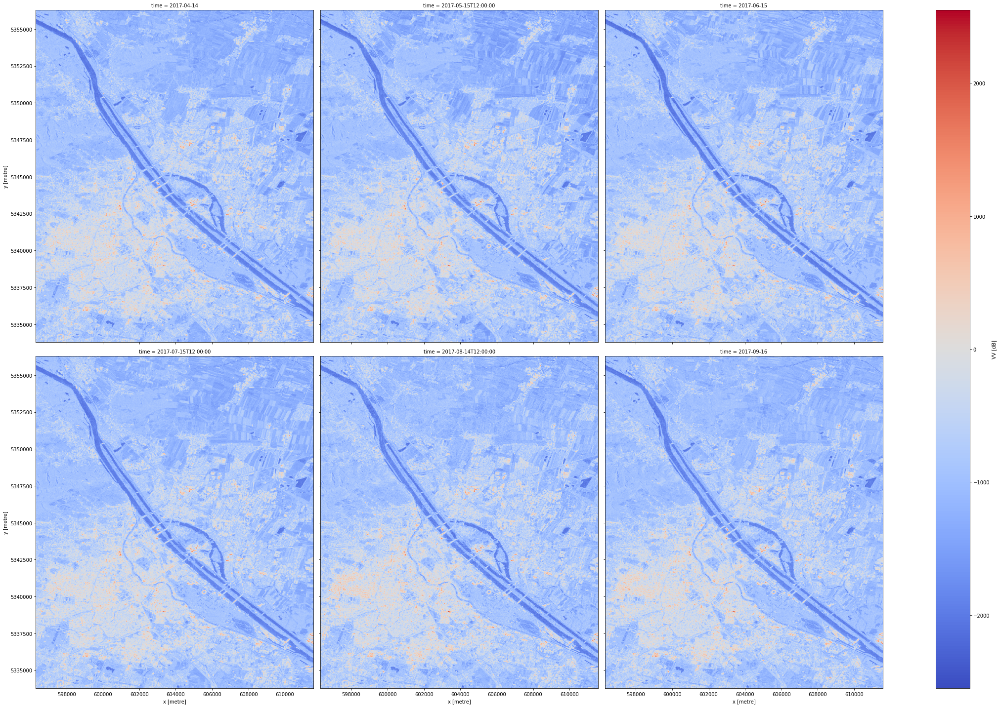

In [53]:
data_plot_vv.plot.imshow(x=data.crs.dimensions[1], 
                      y=data.crs.dimensions[0],
                      col='time',
                      size=10,
                      col_wrap=3,
                      cmap='coolwarm')

(array([4.249550e+05, 1.398698e+06, 9.433775e+06, 6.124512e+06,
        2.662011e+06, 4.964640e+05, 5.341400e+04, 6.529000e+03,
        5.820000e+02, 6.000000e+01]),
 array([-2285. , -1801.6, -1318.2,  -834.8,  -351.4,   132. ,   615.4,
         1098.8,  1582.2,  2065.6,  2549. ]),
 <a list of 10 Patch objects>)

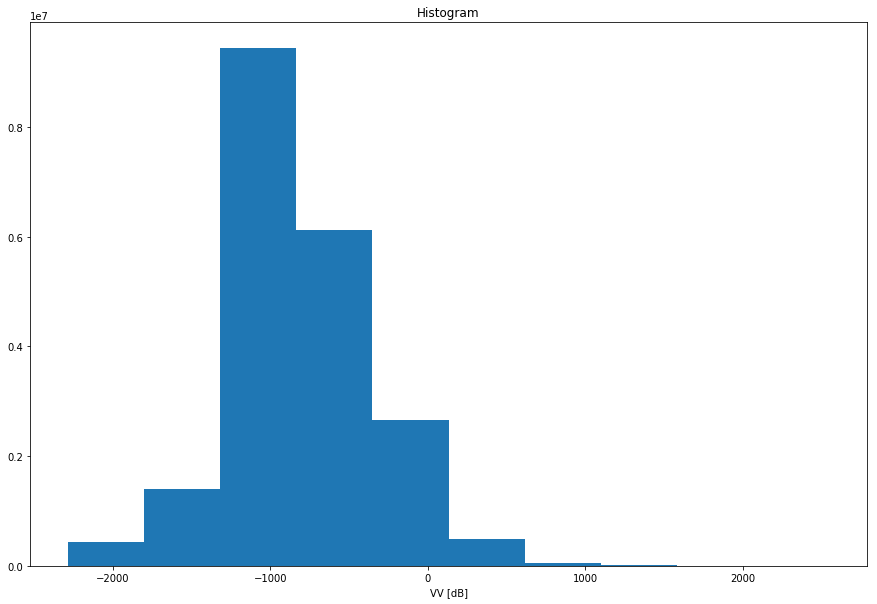

In [54]:
data_plot_vv.plot(size=10)

In [55]:
data_plot_vh = data.VH
data_plot_vh

<xarray.DataArray 'VH' (time: 6, y: 2250, x: 1526)>
array([[[-1536, -1547, ..., -1725, -1725],
        [-1452, -1467, ..., -1807, -1835],
        ...,
        [ -347,  -529, ...,  -748,  -913],
        [ -516,  -767, ...,  -617,  -658]],

       [[-1525, -1535, ..., -1669, -1668],
        [-1547, -1449, ..., -1821, -1754],
        ...,
        [-1033,  -951, ...,  -746,  -927],
        [-1159, -1060, ...,  -647,  -674]],

       ...,

       [[-1622, -1524, ..., -1587, -1540],
        [-1629, -1426, ..., -1680, -1697],
        ...,
        [-1684, -1568, ...,  -926, -1051],
        [-1708, -1594, ...,  -806,  -776]],

       [[-1551, -1504, ..., -1718, -1625],
        [-1578, -1479, ..., -1917, -1802],
        ...,
        [-1619, -1605, ...,  -833,  -976],
        [-1618, -1611, ...,  -819,  -802]]], dtype=int16)
Coordinates:
  * time     (time) datetime64[ns] 2017-04-14 2017-05-15T12:00:00 ... 2017-09-16
  * y        (y) float64 5.356e+06 5.356e+06 5.356e+06 ... 5.334e+06 5.334e+06
 

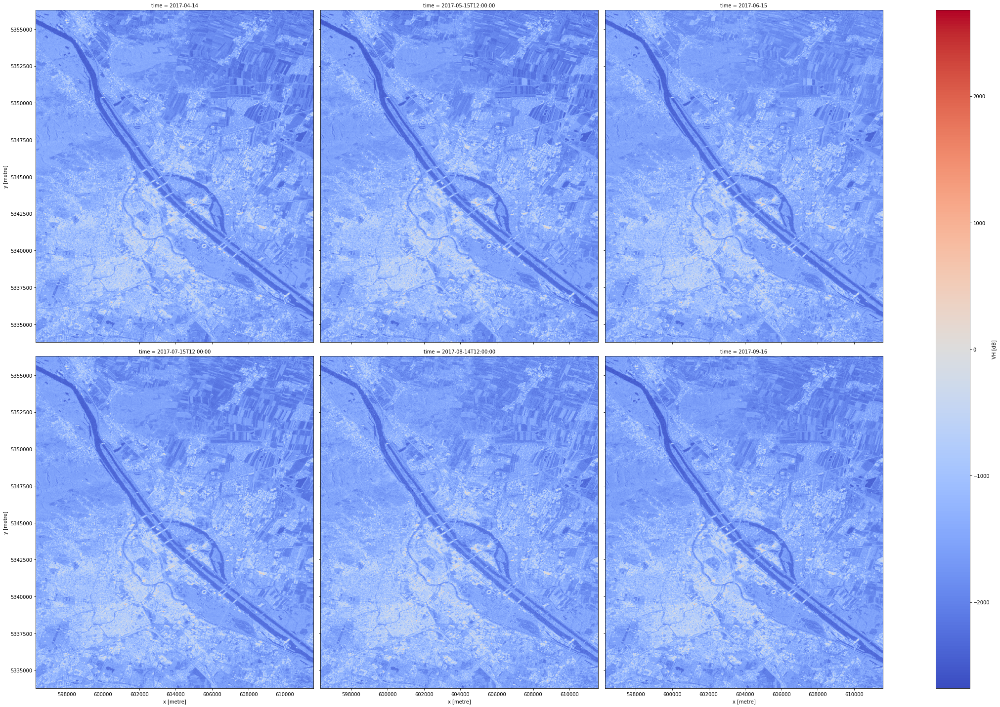

In [56]:
data_plot_vh.plot.imshow(x=data.crs.dimensions[1], 
                      y=data.crs.dimensions[0],
                      col='time',
                      size=10,
                      col_wrap=3,
                      cmap='coolwarm')

(array([2.744010e+05, 2.981518e+06, 9.078265e+06, 5.440354e+06,
        2.211423e+06, 5.430600e+05, 6.403900e+04, 7.260000e+03,
        6.350000e+02, 4.500000e+01]),
 array([-2680. , -2258.6, -1837.2, -1415.8,  -994.4,  -573. ,  -151.6,
          269.8,   691.2,  1112.6,  1534. ]),
 <a list of 10 Patch objects>)

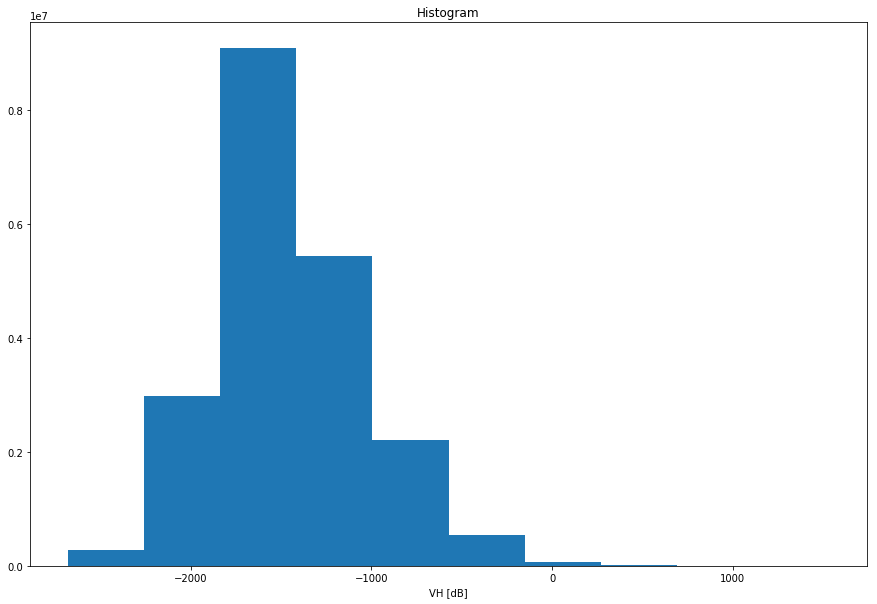

In [57]:
data_plot_vh.plot(size=10)

## Downloading the data

Cell below exports the data in NetCDF and GeoTiff. The file appears on the left and it may be downloaded through the interface.

In [58]:
datacube.storage.storage.write_dataset_to_netcdf(dataset=data, filename='MMENSIG0.nd')

In [59]:
filename = 'MMENSIG0'
for i in range(len(data.time)):
    date = str(data.isel(time=i).time.data)[:-19] # Without time
    filename2='{}_{}.tif'.format(filename, date)
    print('Saved: ', date)
    datacube.helpers.write_geotiff(filename2, data.isel(time=i))

Saved:  2017-04-14
Saved:  2017-05-15
Saved:  2017-06-15
Saved:  2017-07-15
Saved:  2017-08-14
Saved:  2017-09-16
